In [39]:
import pandas as pd
import re
from ydata_profiling import ProfileReport
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import shapiro


def Create_Hist_Normal_Plot_With_Stats_Outliers(df):
    # Select numeric columns only
    numeric_cols = df.select_dtypes(include=['number']).columns
    num_cols = len(numeric_cols)
    
    if num_cols == 0:
        print("No numeric columns to plot.")
        return

    # Create subplots in a single column layout
    fig, axes = plt.subplots(num_cols, 1, figsize=(8, num_cols * 4))
    
    # If there's only one plot, put it in a list for consistency.
    if num_cols == 1:
        axes = [axes]
    
    for i, col in enumerate(numeric_cols):
        # Convert column values to numeric and drop non-convertible values
        data = pd.to_numeric(df[col], errors='coerce').dropna()
        if data.empty:
            axes[i].text(0.5, 0.5, f'No valid numeric data in {col}', ha='center')
            axes[i].set_title(f'Histogram for {col}')
            continue

        # Compute basic statistics
        mean = data.mean()
        median = data.median()
        std = data.std()
        
        # Identify outliers using the IQR method
        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data[(data < lower_bound) | (data > upper_bound)]
        outlier_count = len(outliers)
        
        # Plot the histogram (density normalized)
        axes[i].hist(data, bins=30, density=True, alpha=0.6, color='gray', edgecolor='black')
        
        # Plot the normal curve based on the computed mean and std
        xmin, xmax = data.min(), data.max()
        x = np.linspace(xmin, xmax, 100)
        p = stats.norm.pdf(x, mean, std)
        axes[i].plot(x, p, 'b-', linewidth=2, label='Normal Curve')
        
        # Plot vertical dashed lines for mean and median
        axes[i].axvline(mean, color='red', linestyle='dashed', linewidth=1.5, label='Mean')
        axes[i].axvline(median, color='orange', linestyle='dashed', linewidth=1.5, label='Median')
        
        # Perform Shapiro–Wilk test if there are enough data points (at least 3)
        if len(data) >= 3:
            shapiro_stat, shapiro_p = stats.shapiro(data)
            shapiro_text = f"Shapiro: stat={shapiro_stat:.2f}, p={shapiro_p:.4f}"
        else:
            shapiro_text = "Shapiro: Not enough data"
        
        # Create annotation text that includes the statistics and outlier count
        stats_text = f"Mean: {mean:.2f}, Median: {median:.2f}, Std: {std:.2f}"
        outlier_text = f"Outliers: {outlier_count}"
        annotation_text = f"{stats_text}\n{outlier_text}\n{shapiro_text}"
        
        # Annotate below the plot with extra vertical padding (adjust y-coordinate as needed)
        axes[i].text(0.5, -0.30, annotation_text, transform=axes[i].transAxes,
                     ha='center', va='center', fontsize=9,
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
        
        # Set the title and legend
        axes[i].set_title(f'Histogram of {col}')
        axes[i].legend()
        
        # Rotate tick labels for readability
        for label in axes[i].get_xticklabels():
            label.set_rotation(45)
        for label in axes[i].get_yticklabels():
            label.set_rotation(45)
    
    # Adjust layout to give room for annotations and prevent label overlap
    fig.tight_layout(pad=3.0)
    plt.subplots_adjust(hspace=1.2)
    plt.show()

def Create_QQ_Plot(df):
    # Select numeric columns only
    numeric_cols = df.select_dtypes(include=['number']).columns
    num_cols = len(numeric_cols)
    
    if num_cols == 0:
        print("No numeric columns to plot.")
        return

    # Create subplots in a single column layout
    fig, axes = plt.subplots(num_cols, 1, figsize=(8, num_cols * 4))
    
    if num_cols == 1:
        axes = [axes]
    
    # Loop through each numeric column and create a QQ-plot
    for i, col in enumerate(numeric_cols):
        data = pd.to_numeric(df[col], errors='coerce').dropna()
        if data.empty:
            axes[i].text(0.5, 0.5, f'No valid numeric data in {col}', ha='center')
            axes[i].set_title(f'QQ Plot for {col}')
            continue

        # Generate the QQ-plot using statsmodels
        sm.qqplot(data, line='s', ax=axes[i])
        axes[i].set_title(f'QQ Plot of {col}')
        
        # Rotate tick labels for readability
        for label in axes[i].get_xticklabels():
            label.set_rotation(45)
        for label in axes[i].get_yticklabels():
            label.set_rotation(45)
    
    # Adjust layout so that the plots are spaced out properly
    fig.tight_layout(pad=3.0)
    plt.subplots_adjust(hspace=0.8)
    plt.show()


In [50]:
def convert_to_numeric(df):
    for col in df.select_dtypes(include=['object']).columns:
        # Replace commas with periods and convert to numeric (non-convertible values become NaN)
        df[col] = df[col].str.replace(',', '.')
        df[col] = pd.to_numeric(df[col], errors='coerce')
    return df

def extract_int(x):
    digits = re.sub(r'\D', '', x)
    return int(digits) if digits else 0

def convert_quarter_string(s):
    s = s.strip()
    # Expected pattern: "YYYY <number>[optional letter] kwartaal"
    pattern = r"^(\d{4})\s+(\d+)[a-zA-Z]*\s+kwartaal$"
    m = re.fullmatch(pattern, s)
    if m:
        year = m.group(1)
        quarter = m.group(2)
        return pd.Period(f"{year}Q{quarter}", freq='Q')
    else:
        return None

def convert_year_string(s):
    s = s.strip()
    # Expected: exactly a four-digit year.
    m = re.fullmatch(r"\d{4}", s)
    if m:
        return int(s)
    else:
        return None
    
def convert_year_month_string(s):
    # If the value is already a Period, convert it directly.
    if isinstance(s, pd.Period):
        return s.to_timestamp(how='end')
    
    s = str(s).strip().lower()  # Normalize the string (e.g., lowercase for Dutch month names)
    
    # Mapping for Dutch month names to month numbers
    dutch_months = {
        'januari': '01',
        'februari': '02',
        'maart': '03',
        'april': '04',
        'mei': '05',
        'juni': '06',
        'juli': '07',
        'augustus': '08',
        'september': '09',
        'oktober': '10',
        'november': '11',
        'december': '12'
    }
    
    # First, try the direct conversion to a Period with monthly frequency.
    try:
        period_obj = pd.Period(s, freq='M')
        return period_obj
    except Exception:
        pass

    # New branch: try to match format like "1960M02"
    m = re.match(r"(\d{4})m(\d{1,2})", s)
    if m:
        year = int(m.group(1))
        month = int(m.group(2))
        period_obj = pd.Period(f"{year}-{month:02d}", freq='M')
        return period_obj

    # Try to match numeric year-month (formats like "2025-01" or "2025 1")
    m = re.match(r"(\d{4})[-\s]?(\d{1,2})", s)
    if m:
        year = int(m.group(1))
        month = int(m.group(2))
        period_obj = pd.Period(f"{year}-{month:02d}", freq='M')
        return period_obj
    
    # Try to match Dutch month names (formats like "2025 januari")
    m = re.match(r"(\d{4})\s*([a-zA-Z]+)", s)
    if m:
        year = int(m.group(1))
        month_str = m.group(2)
        month_num = dutch_months.get(month_str.lower())
        if month_num:
            period_obj = pd.Period(f"{year}-{month_num}", freq='M')
            return period_obj
    
    # If none of the above worked, return None.
    return None

    
def expand_quarter_to_daily(df, quarter_col=None, use_index=False):

    expanded_rows = []
    
    for idx, row in df.iterrows():
        # Extract the quarter string either from the index or the specified column.
        if use_index:
            quarter_str = str(idx).strip()
        else:
            if quarter_col is None:
                raise ValueError("quarter_col must be provided if use_index is False.")
            quarter_str = str(row[quarter_col]).strip()
        
        # Skip rows that should be dropped.
        if quarter_str == "Bron: CBS":
            continue
        
        period = convert_quarter_string(quarter_str)
        if period is None:
            continue  # Skip rows not matching the expected quarter format.
        
        start_date = period.start_time
        end_date = period.end_time
        
        # Create a daily date range for the quarter.
        daily_index = pd.date_range(start=start_date, end=end_date, freq='D')
        # Duplicate the row for each day.
        row_expanded = pd.DataFrame([row] * len(daily_index), index=daily_index)
        row_expanded['date'] = daily_index
        
        expanded_rows.append(row_expanded)
    
    return pd.concat(expanded_rows) if expanded_rows else pd.DataFrame()



def expand_year_to_daily(df, year_col=None, use_index=False):
    expanded_rows = []
    
    for idx, row in df.iterrows():
        # Extract the year string either from the index or from the specified column.
        if use_index:
            year_str = str(idx).strip()
        else:
            if year_col is None:
                raise ValueError("year_col must be provided if use_index is False.")
            year_str = str(row[year_col]).strip()
        
        year_int = convert_year_string(year_str)
        if year_int is None:
            continue  # Skip rows that do not have a valid year.
        
        start_date = pd.Timestamp(year=year_int, month=1, day=1)
        end_date = pd.Timestamp(year=year_int, month=12, day=31)
        
        # Create a daily date range for the year.
        daily_index = pd.date_range(start=start_date, end=end_date, freq='D')
        # Duplicate the row for each day.
# Convert the row to a dictionary and then create a DataFrame by replicating the dictionary values.
        row_dict = row.to_dict()
        row_expanded = pd.DataFrame({key: [value] * len(daily_index) for key, value in row_dict.items()},
                                    index=daily_index)
        row_expanded['date'] = daily_index
        
        expanded_rows.append(row_expanded)
    
    return pd.concat(expanded_rows) if expanded_rows else pd.DataFrame()

def expand_year_month_to_daily(df, year_month_col=None, use_index=False):
    expanded_rows = []

    for idx, row in df.iterrows():
        # Extract the year-month string either from index or a specified column.
        if use_index:
            year_month_str = str(idx).strip()
        else:
            if year_month_col is None:
                raise ValueError("year_month_col must be provided if use_index is False")
            year_month_str = str(row[year_month_col]).strip()
        
        period = convert_year_month_string(year_month_str)
        if period is None:
            continue  # Skip rows that don't have a valid year-month
        
        # Determine start and end dates for the month.
        start_date = period.start_time  # first day of the month
        end_date = period.end_time      # last day of the month

        # Create a daily date range for that month.
        daily_index = pd.date_range(start=start_date, end=end_date, freq='D')
        
        # Duplicate the row for each day.
        # Instead of repeating the row (which can cause duplicate-index issues),
        # we create a dictionary with each column's value repeated.
        row_dict = row.to_dict()
        daily_df = pd.DataFrame({key: [value] * len(daily_index) for key, value in row_dict.items()},
                                index=daily_index)
        # Optionally add a 'date' column.
        daily_df['date'] = daily_index
        
        expanded_rows.append(daily_df)
    
    if expanded_rows:
        return pd.concat(expanded_rows)
    else:
        return pd.DataFrame()




/var/folders/_g/_68qf0jx3dv_zdyngnnzdwc40000gn/T/ipykernel_15516/3386526769.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LaborParticipation['Beroepsbevolking|Werkloosheidspercentage'] = LaborParticipation['Beroepsbevolking|Werkloosheidspercentage'].astype(str).str.replace(',', '.')


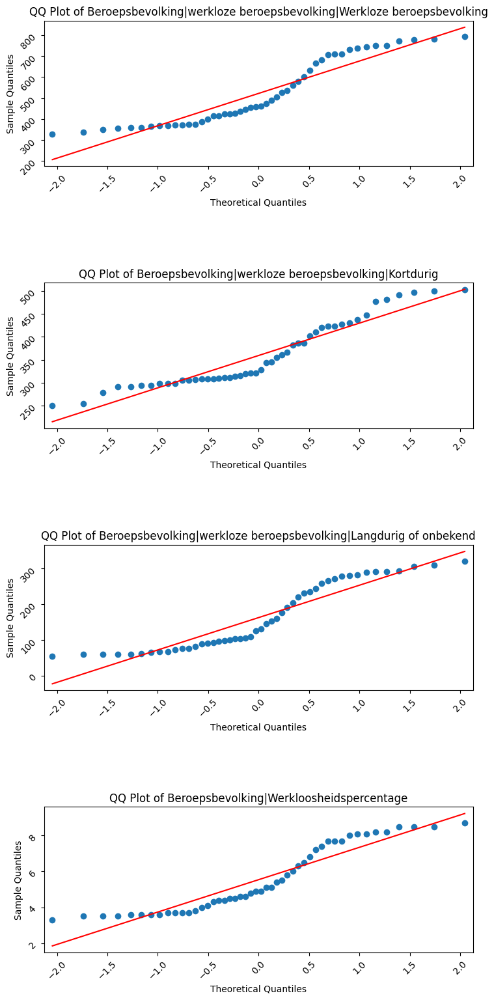

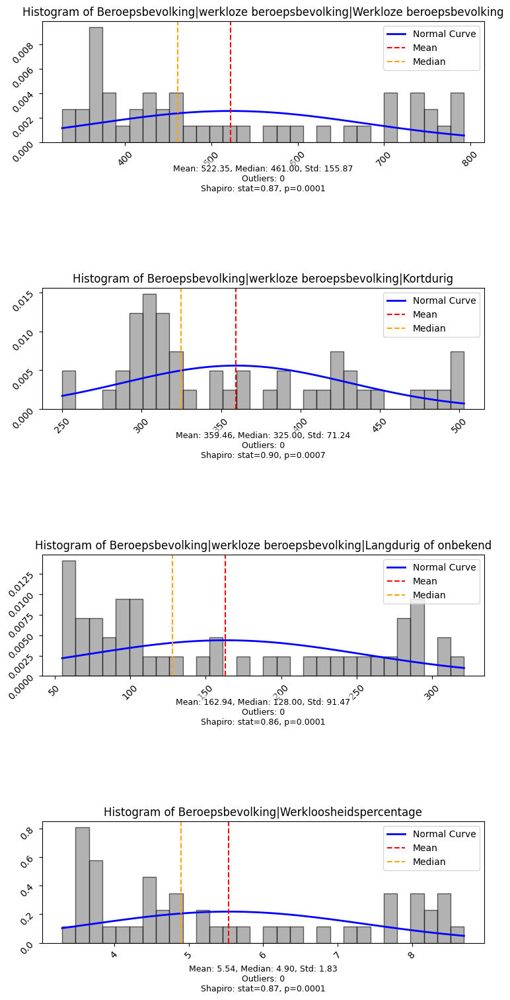

In [51]:

LaborParticipation = pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Arbeidsdeelname__kerncijfers_seizoengecorrigeerd_21022025_095354.csv',
sep=';', header=3)


LaborParticipation = LaborParticipation.drop([0])


# #generating a report
def LaborParticipationPreprocess(LaborParticipation):
    LaborParticipation['Unnamed: 0'] = LaborParticipation['Unnamed: 0'].apply(lambda x: convert_quarter_string(x))
    LaborParticipation['Unnamed: 0'] = (
        pd.PeriodIndex(LaborParticipation['Unnamed: 0'], freq="Q")
        .to_timestamp()  # Converts Period to datetime
    )
    LaborParticipation.set_index('Unnamed: 0', inplace=True)
    LaborParticipation.index.names = ['Date']
    # In the data full years could be skipped, due to the conversion these became null thus we can drop them
    LaborParticipation = LaborParticipation[LaborParticipation.index.notnull()]
    LaborParticipation['Beroepsbevolking|Werkloosheidspercentage'] = LaborParticipation['Beroepsbevolking|Werkloosheidspercentage'].astype(str).str.replace(',', '.')
    LaborParticipation = LaborParticipation.apply(pd.to_numeric, errors='coerce')
    return LaborParticipation


df_LaborParticipation = LaborParticipationPreprocess(LaborParticipation)

LaborParticipation_QQ_plots = Create_QQ_Plot(df_LaborParticipation)
LaborParticipation_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(df_LaborParticipation)






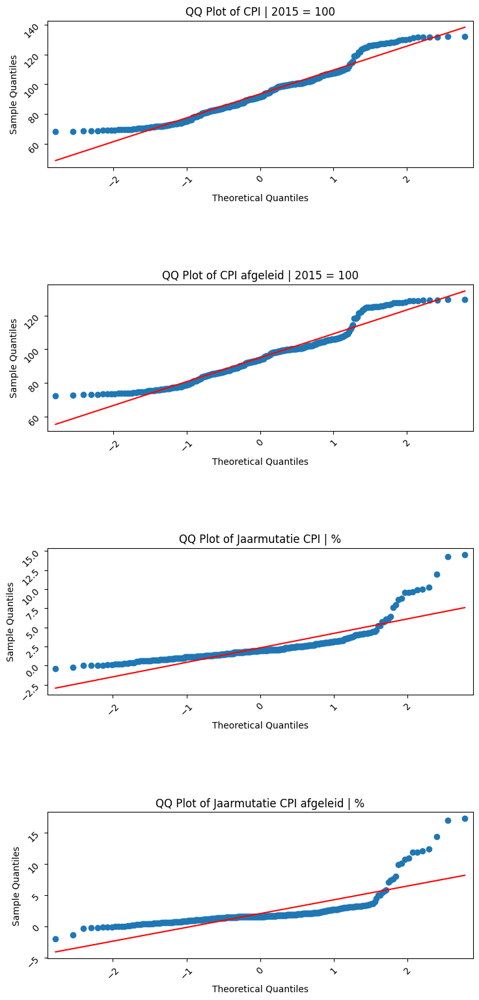

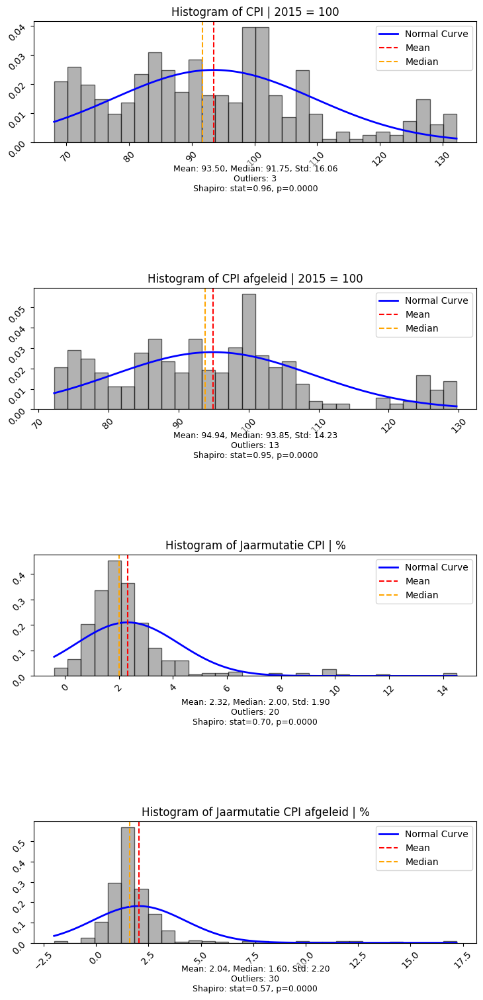

In [56]:
ConsumerPriceIndex = pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Consumentenprijzen__prijsindex_2015_100_01032025_140302.csv',sep=';', header=3)
ConsumerPriceIndex.drop([0])

def ConsumerPriceIndexPreprocess(ConsumerPriceIndex):
    ConsumerPriceIndex.columns += ' | ' + ConsumerPriceIndex.iloc[0]
    ConsumerPriceIndex = ConsumerPriceIndex.drop(0)
    
    ConsumerPriceIndex['Unnamed: 0 | Perioden'] = ConsumerPriceIndex['Unnamed: 0 | Perioden'].apply(lambda x: convert_year_month_string(x))
    ConsumerPriceIndex.set_index(['Unnamed: 0 | Perioden'], inplace=True)
    ConsumerPriceIndex.index.names = ['Date']
    ConsumerPriceIndex = convert_to_numeric(ConsumerPriceIndex)
    return ConsumerPriceIndex

# ConsumerPriceIndexPreprocess(ConsumerPriceIndex)
df_ConsumerPriceIndex = ConsumerPriceIndexPreprocess(ConsumerPriceIndex)

ConsumerPriceIndex_Distribution_Plots = Create_QQ_Plot(df_ConsumerPriceIndex)
ConsumerPriceIndex_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(df_ConsumerPriceIndex)






Total population size by age per year. Added a with the average age

Duplicate columns:
Index([], dtype='int64', name='Leeftijd')


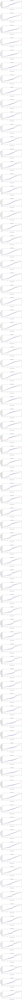

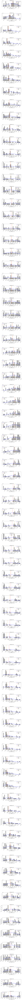

In [316]:
PopulationSize = pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Bevolking_op_1_januari_en_gemiddeld__geslacht__leeftijd_en_regio_23022025_161215.csv',sep=';',header=3)
PopulationSize = PopulationSize.drop(['Unnamed: 0'],axis=1)


      


def PopulationSizePreprocess(PopulationSize,string):
    df = PopulationSize
    df = df.set_index('Onderwerp')
    # Filter columns where the column label contains the substring (case-insensitive)
    df_filtered = df.loc[:, df.columns.str.contains(string, case=False, na=False)]
    # Set the column names to the values in row at index 2
    df_filtered.columns = df_filtered.iloc[2]

    # Drop the first three rows (rows 0, 1, and the row we just used as headers)
    df_filtered = df_filtered.iloc[3:]
    df_filtered.index.names = ['Date']

    df_filtered.columns =  df_filtered.columns.map(extract_int)
    df_filtered = df_filtered.drop(index=['Perioden'])
    df_filtered.rename(index={'Leeftijd':''}, inplace=True)
    df_filtered = df_filtered.apply(pd.to_numeric, errors='coerce')
    # df_filtered = df_filtered.drop(df.columns[0], axis=1)
    return df_filtered


df_1jan_population = PopulationSizePreprocess(PopulationSize,'1 januari')

df = df.drop(df.columns[[0]], axis=1)

duplicate_mask = df.columns.duplicated()
print("Duplicate columns:")
print(df.columns[duplicate_mask])
mask = (df.columns <= 94) | (np.isnan(df.columns))

# Filter the DataFrame based on the mask.
df = df.loc[:, mask]

Create_QQ_Plot(df)
Create_Hist_Normal_Plot_With_Stats_Outliers(df)




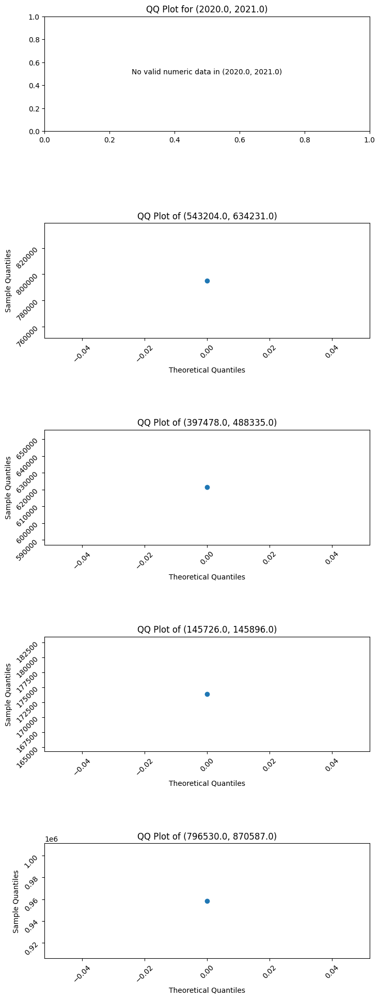

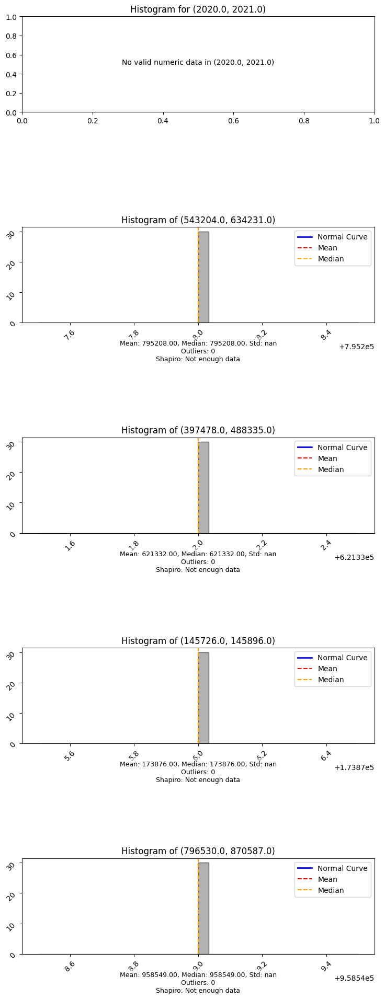

,2020.0,543204.0,397478.0,145726.0,796530.0
,2021.0,634231.0,488335.0,145896.0,870587.0
0,NaN,795208,621332,173876,958549


In [200]:
Gdp = pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Opbouw_binnenlands_product__bbp___nationale_rekeningen__1995_2022_28022025_221707.csv',sep=';', header=2).T

# Gdp_daily = expand_year_to_daily(Gdp,use_index=True )

df = Gdp
df.columns = pd.MultiIndex.from_arrays([df.iloc[0].tolist(), df.iloc[1].tolist()])

# Remove the first two rows from the DataFrame:
df = df.iloc[2:].reset_index(drop=True)

df = df.apply(pd.to_numeric, errors='coerce')    
df = df.drop(df.columns[-1], axis=1)

Gdp_QQ_Plots = Create_QQ_Plot(df)
Gdp_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(df)

df.head()



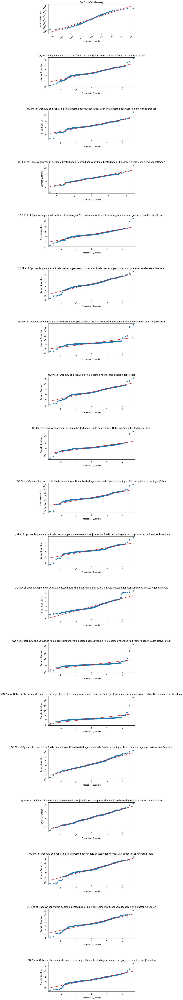

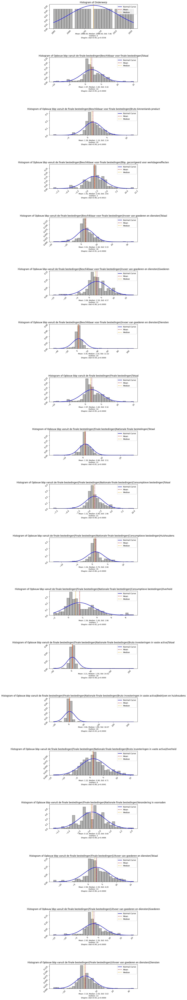

In [87]:
GdpProductionAndSpending = pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Bbp__productie_en_bestedingen__kwartalen__mutaties__na__1995__2024_I_28022025_214426.csv',sep=';', header=3).T
GdpProductionAndSpending = GdpProductionAndSpending.reset_index(drop=True)
# set header of
GdpProductionAndSpending.columns = GdpProductionAndSpending.iloc[0]

GdpProductionAndSpending = GdpProductionAndSpending.drop('Bron: CBS', axis=1)   
GdpProductionAndSpending_daily = expand_quarter_to_daily(GdpProductionAndSpending, 'Onderwerp')

GdpProductionAndSpending = convert_to_numeric(GdpProductionAndSpending)
GdpProductionAndSpending = GdpProductionAndSpending.apply(pd.to_numeric, errors='coerce')
GdpProductionAndSpending_QQ_Plots = Create_QQ_Plot(GdpProductionAndSpending)
GdpProductionAndSpending_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(GdpProductionAndSpending) 


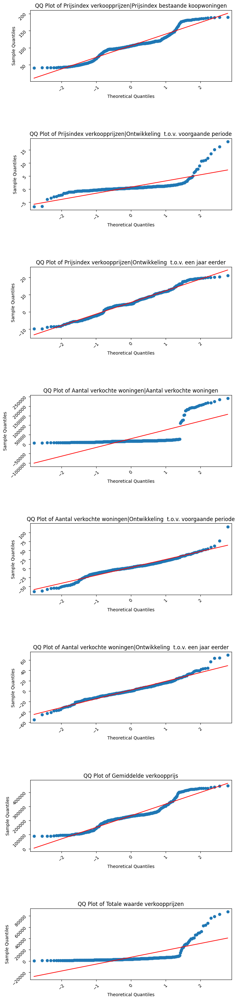

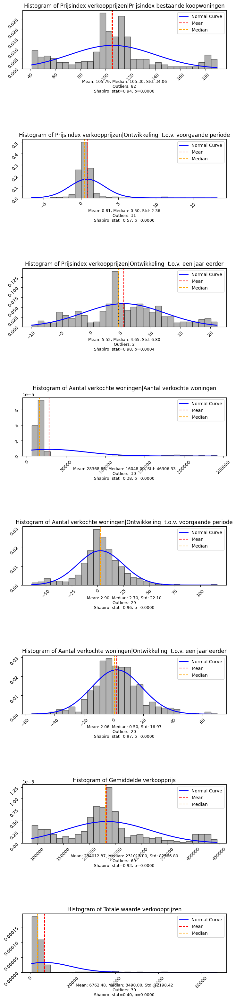

In [84]:
Boughthomes =  pd.read_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/CBS/Bestaande_koopwoningen__verkoopprijzen_prijsindex_2015_100_1995_2023_25022025_192415.csv',sep=';', header=3)

# Boughthomes_daily = expand_year_month_to_daily(Boughthomes, year_month_col="Unnamed: 0")
Boughthomes['Unnamed: 0'] = Boughthomes['Unnamed: 0'].apply(lambda x: convert_year_month_string(x))
Boughthomes.rename(columns={'Unnamed: 0':'Date'}, inplace=True)
Boughthomes.set_index(['Date'], inplace=True)
Boughthomes = Boughthomes.iloc[1:]
Boughthomes = convert_to_numeric(Boughthomes)
Boughthomes = Boughthomes.apply(pd.to_numeric, errors='coerce')
Boughthomes_QQ_Plots = Create_QQ_Plot(Boughthomes)
Boughthomes_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(Boughthomes)



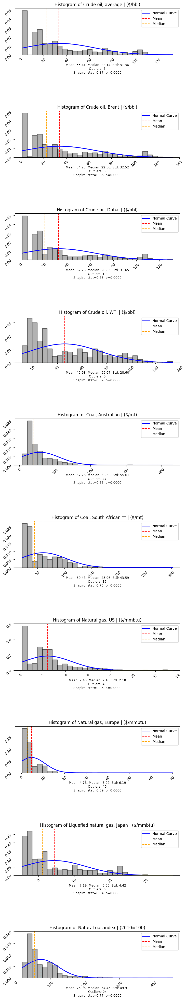

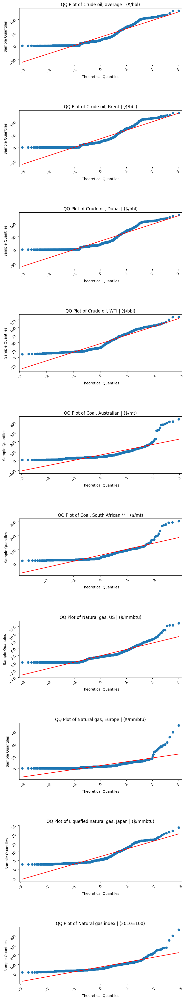

In [86]:
def find_columns_energy_commodities(df):
    # Define a pattern that matches any of the keywords
    pattern = r"(Coal|Coal (Colombia)|Coal (South Africa)|Crude oil| index (Laspeyres)|Natural Gas|natural gas)"
    # Use a list comprehension to check each column name
    matching_columns = [col for col in df.columns if re.search(pattern, str(col), re.IGNORECASE)]

    return matching_columns

# Commodities_daily = expand_year_month_to_daily(Commodities, year_month_col="Unnamed: 0")
# Commodities_daily.drop(['Unnamed: 0','date'],axis=1,inplace=True)
Commodities = pd.read_excel('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/Commodity Future Data/CMO/CMO-Historical-Data-Monthly.xlsx',sheet_name='Monthly Prices',skiprows=4)
Commodities['Unnamed: 0'] = Commodities['Unnamed: 0'].apply(lambda x: convert_year_month_string(x))
Commodities.set_index('Unnamed: 0', inplace=True)
Commodities.index.names = ['Date']
Commodities.columns += ' | ' + Commodities.iloc[0]
Commodities = Commodities.iloc[1:]

df_Commodities = Commodities[find_columns_energy_commodities(Commodities)]
df_Commodities = df_Commodities.apply(pd.to_numeric, errors='coerce')
Commodities_Distribution_Plots = Create_Hist_Normal_Plot_With_Stats_Outliers(df_Commodities)
Commodities_QQ_Plots = Create_QQ_Plot(df_Commodities)


In [47]:
# Reset index to turn the date index into a column
# Will embed this into the function I will make for each individual dataframe.
# Gdp_daily_reset = Gdp.reset_index()
# GdpProductionAndSpending_reset = GdpProductionAndSpending.reset_index()
# PopulationSize_reset = PopulationSize.reset_index()
# ConsumerPriceIndex_reset = ConsumerPriceIndex.reset_index()
# LaborParticipation_reset = LaborParticipation.reset_index()
# Boughthomes_dreset = Boughthomes.reset_index()
# Commodities_reset = Commodities.reset_index()



# Merge the dataframes on the 'index' column (which holds the dates)
combined_df = GdpProductionAndSpending.merge(PopulationSize, on='Date', how='outer') \
                         .merge(ConsumerPriceIndex,on='Date', how='outer')\
                         .merge(LaborParticipation,on='Date', how='outer')\
                         .merge(Boughthomes,on='Date', how='outer')\
                         .merge(Commodities,on='Date', how='outer')

# Optionally, set the 'index' column back as the index
combined_df.set_index('index', inplace=True)


combined_df.to_csv('/Users/ruben/Documents/GitHub/MsCThesisRubenCuriel2024/Data/combined_df.csv')

# Define the constant comparison date

combined_df


KeyError: 'Date'

In [ ]:
combined_df[combined_df.index >= '1996-01-01']

,Bbp vanuit de finale bestedingen|Waarde in werkelijke prijzen|Invoer van goederen en diensten (-)|Totaal,Bbp vanuit de finale bestedingen|Waarde in werkelijke prijzen|Invoer van goederen en diensten (-)|Goederen,Bbp vanuit de finale bestedingen|Waarde in werkelijke prijzen|Invoer van goederen en diensten (-)|Diensten,Bbp vanuit de finale bestedingen|Waarde in werkelijke prijzen|Bruto binnenlands product,Bron: CBS,date_x,Onderwerp,Opbouw bbp vanuit de finale bestedingen|Beschikbaar voor finale bestedingen|Totaal,Opbouw bbp vanuit de finale bestedingen|Beschikbaar voor finale bestedingen|Bruto binnenlands product,"Opbouw bbp vanuit de finale bestedingen|Beschikbaar voor finale bestedingen|Bbp, gecorrigeerd voor werkdageneffecten",...,Aluminum,"Iron ore, cfr spot",Copper,Lead,Tin,Nickel,Zinc,Gold,Platinum,Silver
index,,,,,,,,,,,,,,,,,,,,,
1996-01-01,176946.0,136621.0,40325.0,344625.0,NaN,1996-01-01,1996 1e kwartaal,"3,5","2,4",.,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-01,176946.0,136621.0,40325.0,344625.0,NaN,1996-01-01,1996 1e kwartaal,.,.,.,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-02,176946.0,136621.0,40325.0,344625.0,NaN,1996-01-02,1996 1e kwartaal,"3,5","2,4",.,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-02,176946.0,136621.0,40325.0,344625.0,NaN,1996-01-02,1996 1e kwartaal,.,.,.,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-03,176946.0,136621.0,40325.0,344625.0,NaN,1996-01-03,1996 1e kwartaal,"3,5","2,4",.,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640
2024-12-28,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640
2024-12-29,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640


In [ ]:
cutoff_date = pd.Timestamp('1996-01-01')
filtered_df = combined_df[combined_df.index >= cutoff_date]

In [ ]:
filtered_df

,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Beloning van werknemers|Totaal,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Beloning van werknemers|Lonen,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Beloning van werknemers|Sociale premies t.l.v. werkgevers,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Belastingen en subsidies|Saldo,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Belastingen en subsidies|Belastingen op productie en invoer,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Belastingen en subsidies|Subsidies,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Exploitatieoverschot|Bruto,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Exploitatieoverschot|Verbruik van vaste activa (-),Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Exploitatieoverschot|Netto,Bbp vanuit de inkomensvorming|Waarde in werkelijke prijzen|Bruto binnenlands product,...,Aluminum,"Iron ore, cfr spot",Copper,Lead,Tin,Nickel,Zinc,Gold,Platinum,Silver
date,,,,,,,,,,,,,,,,,,,,,
1996-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
1996-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1589.34,30.00,2616.41,709.50,6271.60,7862.05,1019.10,399.45,415.48,5.4605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640
2024-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640
2024-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2541.02,102.21,8916.32,1990.43,28864.99,15444.89,3034.16,2648.01,937.88,30.7640
